In [1]:
import numpy as np
import matplotlib as mpl
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
from netCDF4 import Dataset
import xarray as xr
from matplotlib.colors import TwoSlopeNorm
from scipy.stats import lognorm
import cartopy as crs
import shapely.geometry
import shapely.ops

In [32]:
def percent_diff(newdata,base,vars):
    if len(vars)==1:
        pdiff = (newdata[vars[0]][:].to_numpy()-base[vars[0]][:].to_numpy())*100.0/base[vars[0]][:].to_numpy()
        newdata['pdiff'] = (('time', 'lev','lat','lon'), pdiff)
    else:
        for i in range(len(vars)):
            pdiff = (newdata[vars[i]][:].to_numpy()-base[vars[i]][:].to_numpy())*100.0/base[vars[i]][:].to_numpy()
            newdata['pdiff'+str(vars[i])] = (('time', 'lev','lat','lon'), pdiff)
        return newdata
def abs_diff(newdata,base,vars):
    if len(vars) == 1:
        absdiff = newdata[vars[0]][:]-base[vars[0]][:]
    return absdiff
def conccn(ds):
    ds = ( ds.assign
          (conccn = lambda ds : (((1-lognorm(1.59,ds.RDRY_NUS[:,:]*1e9).cdf(3.0))*ds.N_NUS[:,:]) + ds.N_AIS[:,:] + ds.N_ACS[:,:] + ds.N_COS[:,:] + ds.N_AII[:,:] + ds.N_ACI[:,:] + ds.N_COI[:,:]) * 1e-6))
    return(ds)


In [54]:
basecase = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-basecase/globvals/mosaic-basecase-202002-monmean.nc')
bulkmsa = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-bulkmsa/mosaic-bulkmsa-monmean02.nc')
basecase_so4nuc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-basecase-nonucl/mosaic-basecase-nonucl-monmean02.nc')
dmshigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-dmshigh/globvals/mosaic-dmshigh-202002-monmean.nc')
dmslow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-dmslow/globvals/mosaic-dmslow-202002-monmean.nc')
nuclhigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-nuclhigh/globvals/mosaic-nuclhigh-202002-monmean.nc')
nucllow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-nucllow/globvals/mosaic-nucllow-202002-monmean.nc')
msaelvoc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-msaelvoc/globvals/mosaic-msaelvoc-202002-monmean.nc')
msasvoc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-msasvoc/globvals/mosaic-msasvoc-202002-monmean.nc')
sshigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-sshigh/globvals/mosaic-sshigh-202002-monmean.nc')
sslow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-sslow/globvals/mosaic-sslow-202002-monmean.nc')

In [55]:
basecase_conccn = conccn(basecase)
bulkmsa_conccn = conccn(bulkmsa)
basecaseso4nuc_conccn = conccn(basecase_so4nuc)
dmshigh_conccn = conccn(dmshigh)
dmslow_conccn = conccn(dmslow)
nuclhigh_conccn = conccn(nuclhigh)
nucllow_conccn = conccn(nucllow)
msaelvoc_conccn = conccn(msaelvoc)
msasvoc_conccn = conccn(msasvoc)
sshigh_conccn = conccn(sshigh)
sslow_conccn = conccn(sslow)

In [56]:
vars = ['conccn','CCN0.20']
bulkmsa_percentdiff = percent_diff(bulkmsa_conccn,basecase_conccn,vars)
basecaseso4nuc_percentdiff =  percent_diff(basecaseso4nuc_conccn,basecase_conccn,vars)
dmshigh_percentdiff = percent_diff(dmshigh_conccn,basecase_conccn,vars)
dmslow_percentdiff = percent_diff(dmslow_conccn,basecase_conccn,vars)
nuclhigh_percentdiff = percent_diff(nuclhigh_conccn,basecase_conccn,vars)
nucllow_percentdiff = percent_diff(nucllow_conccn,basecase_conccn,vars)
msaelvoc_percentdiff = percent_diff(msaelvoc_conccn,basecase_conccn,vars)
msasvoc_percentdiff = percent_diff(msasvoc_conccn,basecase_conccn,vars)
sshigh_percentdiff = percent_diff(sshigh_conccn,basecase_conccn,vars)
sslow_percentdiff = percent_diff(sslow_conccn,basecase_conccn,vars)

In [57]:
sshigh_percentdiff

<xarray.Dataset> Size: 142MB
Dimensions:          (time: 1, bnds: 2, lon: 120, lat: 90, lev: 34)
Coordinates:
  * time             (time) datetime64[ns] 8B 2020-02-15T12:00:00
  * lon              (lon) float64 960B -178.5 -175.5 -172.5 ... 175.5 178.5
  * lat              (lat) float64 720B -89.0 -87.0 -85.0 ... 85.0 87.0 89.0
  * lev              (lev) float64 272B 1.0 2.0 3.0 4.0 ... 31.0 32.0 33.0 34.0
Dimensions without coordinates: bnds
Data variables: (12/215)
    time_bnds        (time, bnds) datetime64[ns] 16B ...
    temp             (time, lev, lat, lon) float32 1MB ...
    hus              (time, lev, lat, lon) float32 1MB ...
    airmass          (time, lev, lat, lon) float32 1MB ...
    pressure         (time, lev, lat, lon) float32 1MB ...
    prod_gas_so4     (time, lev, lat, lon) float32 1MB ...
    ...               ...
    prod_liq_so42D   (time, lat, lon) float32 43kB ...
    prod_gas_so42D   (time, lat, lon) float32 43kB ...
    emisoa           (time, lat, lon) float32 43kB ...
    conccn           (time, lev, lat, lon) float64 3MB 55.07 55.08 ... 0.03221
    pdiffconccn      (time, lev, lat, lon) float64 3MB -52.54 -52.55 ... 4.854
    pdiffCCN0.20     (time, lev, lat, lon) float32 1MB 156.4 156.5 ... 12.52
Attributes: (12/13)
    CDI:          Climate Data Interface version 2.4.1 (https://mpimet.mpg.de...
    Conventions:  CF-1.6
    source:       TM5-mp
    institution:  Royal Netherlands Meteorological Institute (KNMI), De Bilt,...
    title:        Model output for General
    contact:      Tommi Bergman: tommi.bergman@knmi.nl ; Twan van Noije; noij...
    ...           ...
    conventions:  CF-1.0 - HTAP
    date:         2020-02-01 00:30
    time_units:   days since 2001-01-01 00:00
    references:   http://tm5.sourceforge.net/
    history:      Wed Nov 06 18:32:06 2024: cdo timmean mosaic-sshigh-202002-...
    CDO:          Climate Data Operators version 2.4.1 (https://mpimet.mpg.de...

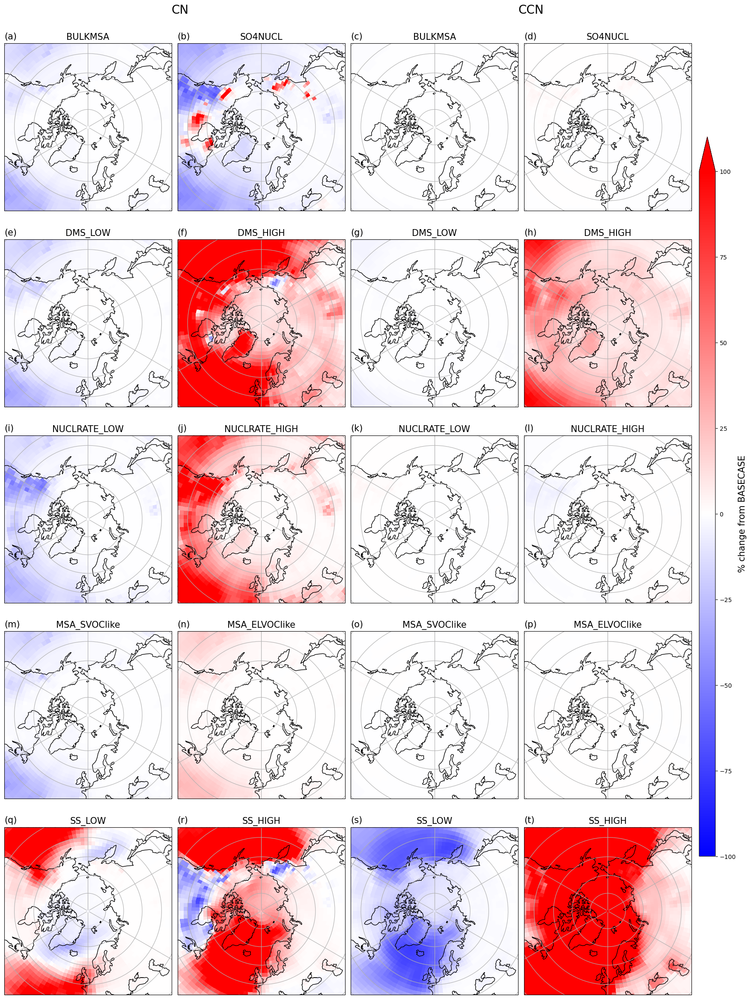

In [63]:
import cartopy.crs as ccrs
fig, axis = plt.subplots(5, 4, figsize = (18,24),subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
plot = basecaseso4nuc_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[0,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[0,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[1,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot1 = dmslow_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[1,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[2,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[2,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[3,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[3,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[4,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[4,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = basecaseso4nuc_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[0,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[0,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[1,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmslow_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[1,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[2,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[2,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[3,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[3,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[4,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[4,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)

exps = ['BULKMSA','SO4NUCL','DMS_LOW','DMS_HIGH','NUCLRATE_LOW','NUCLRATE_HIGH','MSA_SVOClike','MSA_ELVOClike','SS_LOW','SS_HIGH',]
indices = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)']
for i in range(5):
    for j in range(4):
        axis[i,j].coastlines()
        axis[i,j].set_extent([-180,180,90,45],ccrs.PlateCarree())
        axis[i,j].set_title(exps[j%2+(2*i)],size = 15)
        axis[i,j].gridlines()
        #axis[i,j].add_geometries(full_geom_feb.geoms,crs=ccrs.PlateCarree(),facecolor = 'none',edgecolor='green',linewidth=2)
        axis[i,j].text(0, 1.025,indices[j+(4*i)],transform=axis[i,j].transAxes,size = 15)
plt.tight_layout()
plt.figtext(0.225,0.97,'CN',fontsize = 20)
plt.figtext(0.675,0.97,'CCN',fontsize = 20)
fig.subplots_adjust(top=0.95)
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.91, 0.15, 0.021, 0.7])
fig.colorbar(plot1, cax=cbar_ax,extend='max').set_label(label= '% change from BASECASE',size = 15)

plt.savefig('../figures/202002-pdfifffull.png',dpi = 300)

# make colorbar common
# mark lat and lon on the plot

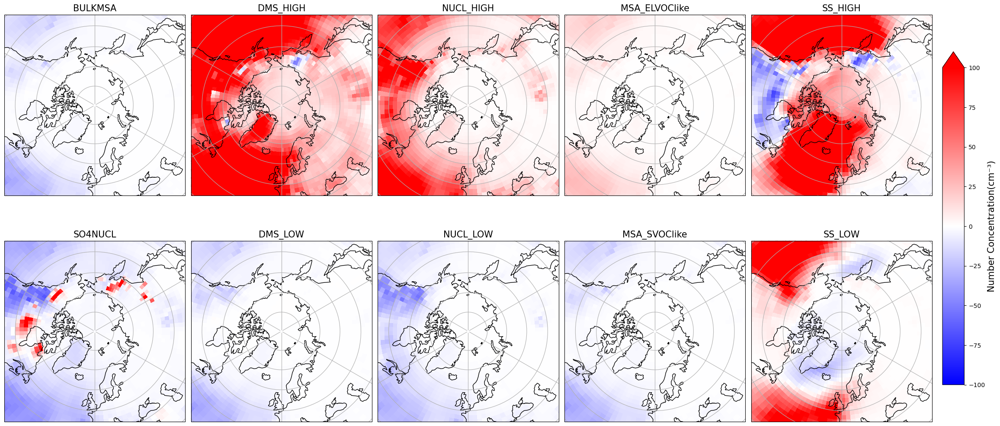

In [8]:
import cartopy.crs as ccrs
fig, axis = plt.subplots(2, 5, figsize = (24,11),subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
plot = basecaseso4nuc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot1 = dmslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,4],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,4],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
exps = exps = ['BULKMSA','SO4NUCL','DMS_HIGH','DMS_LOW','NUCL_HIGH','NUCL_LOW','MSA_ELVOClike','MSA_SVOClike','SS_HIGH','SS_LOW']
indices = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)']
for i in range(2):
    for j in range(5):
        axis[i,j].coastlines()
        axis[i,j].set_extent([-180,180,90,45],ccrs.PlateCarree())
        axis[i,j].set_title(exps[i+(2*j)],size = 15)
        axis[i,j].gridlines()
        #axis[i,j].add_geometries(full_geom_feb.geoms,crs=ccrs.PlateCarree(),facecolor = 'none',edgecolor='green',linewidth=2)
        #axis[i,j].text(0, 1.025,indices[j+(2*i)],transform=axis[i,j].transAxes,size = 15)
plt.tight_layout()
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.91, 0.15, 0.021, 0.7])
fig.colorbar(plot1, cax=cbar_ax,extend='max').set_label(label  = '% change from BASECASE',fontsize = 15)

# make colorbar common
# mark lat and lon on the plot

#plt.tight_layout()
plt.savefig('../figures/202002-percentdiff-conccn-transverse.png',dpi = 300)

# make colorbar common
# mark lat and lon on the plot

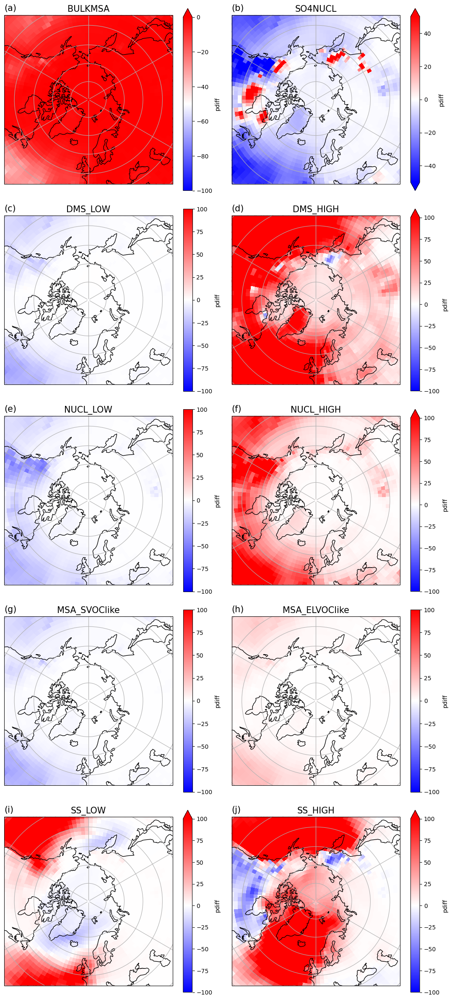

In [13]:
import cartopy.crs as ccrs
fig, axis = plt.subplots(5, 2, figsize = (11,24),subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
plot = basecaseso4nuc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,1],transform=ccrs.PlateCarree(),vmax = 50, vmin = -50,cmap = 'bwr')#,add_colorbar = False)
plot = bulkmsa_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,0],transform=ccrs.PlateCarree(),vmax = 0, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = dmshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot1 = dmslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = nuclhigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[2,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = nucllow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[2,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = msaelvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[3,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = msasvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[3,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = sshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[4,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)
plot = sslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[4,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr')#,add_colorbar = False)exps = ['BULKMSA','SO4NUCL','DMS_LOW','DMS_HIGH','NUCL_LOW','NUCL_HIGH','MSA_SVOClike','MSA_ELVOClike','SS_LOW','SS_HIGH',]
indices = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)']
for i in range(5):
    for j in range(2):
        axis[i,j].coastlines()
        axis[i,j].set_extent([-180,180,90,45],ccrs.PlateCarree())
        axis[i,j].set_title(exps[j+(2*i)],size = 15)
        axis[i,j].gridlines()
        #axis[i,j].add_geometries(full_geom_feb.geoms,crs=ccrs.PlateCarree(),facecolor = 'none',edgecolor='green',linewidth=2)
        axis[i,j].text(0, 1.025,indices[j+(2*i)],transform=axis[i,j].transAxes,size = 15)
plt.tight_layout()
#fig.subplots_adjust(right=0.90)
#cbar_ax = fig.add_axes([0.91, 0.15, 0.021, 0.7])
fig.colorbar(plot1, cax=cbar_ax).set_label(label= '% change from BASECASE',size = 15)



plt.savefig('../figures/202002-percentdiff_noscale.png',dpi = 300)

# make colorbar common
# mark lat and lon on the plot

In [64]:
basecase = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-basecase/globvals/mosaic-basecase-202008-monmean.nc')
bulkmsa = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-bulkmsa/mosaic-bulkmsa-monmean08.nc')
basecase_so4nuc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-basecase-nonucl/mosaic-basecase-nonucl-monmean08.nc')
dmshigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-dmshigh/globvals/mosaic-dmshigh-202008-monmean.nc')
dmslow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-dmslow/globvals/mosaic-dmslow-202008-monmean.nc')
nuclhigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-nuclhigh/globvals/mosaic-nuclhigh-202008-monmean.nc')
nucllow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-nucllow/globvals/mosaic-nucllow-202008-monmean.nc')
msaelvoc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-msaelvoc/globvals/mosaic-msaelvoc-202008-monmean.nc')
msasvoc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-msasvoc/globvals/mosaic-msasvoc-202008-monmean.nc')
sshigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-sshigh/globvals/mosaic-sshigh-202008-monmean.nc')
sslow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-sslow/globvals/mosaic-sslow-202008-monmean.nc')

In [65]:
basecase_conccn = conccn(basecase)
bulkmsa_conccn = conccn(bulkmsa)
basecaseso4nuc_conccn = conccn(basecase_so4nuc)
dmshigh_conccn = conccn(dmshigh)
dmslow_conccn = conccn(dmslow)
nuclhigh_conccn = conccn(nuclhigh)
nucllow_conccn = conccn(nucllow)
msaelvoc_conccn = conccn(msaelvoc)
msasvoc_conccn = conccn(msasvoc)
sshigh_conccn = conccn(sshigh)
sslow_conccn = conccn(sslow)

In [66]:
vars = ['conccn','CCN0.20']
bulkmsa_percentdiff = percent_diff(bulkmsa_conccn,basecase_conccn,vars)
basecaseso4nuc_percentdiff =  percent_diff(basecaseso4nuc_conccn,basecase_conccn,vars)
dmshigh_percentdiff = percent_diff(dmshigh_conccn,basecase_conccn,vars)
dmslow_percentdiff = percent_diff(dmslow_conccn,basecase_conccn,vars)
nuclhigh_percentdiff = percent_diff(nuclhigh_conccn,basecase_conccn,vars)
nucllow_percentdiff = percent_diff(nucllow_conccn,basecase_conccn,vars)
msaelvoc_percentdiff = percent_diff(msaelvoc_conccn,basecase_conccn,vars)
msasvoc_percentdiff = percent_diff(msasvoc_conccn,basecase_conccn,vars)
sshigh_percentdiff = percent_diff(sshigh_conccn,basecase_conccn,vars)
sslow_percentdiff = percent_diff(sslow_conccn,basecase_conccn,vars)

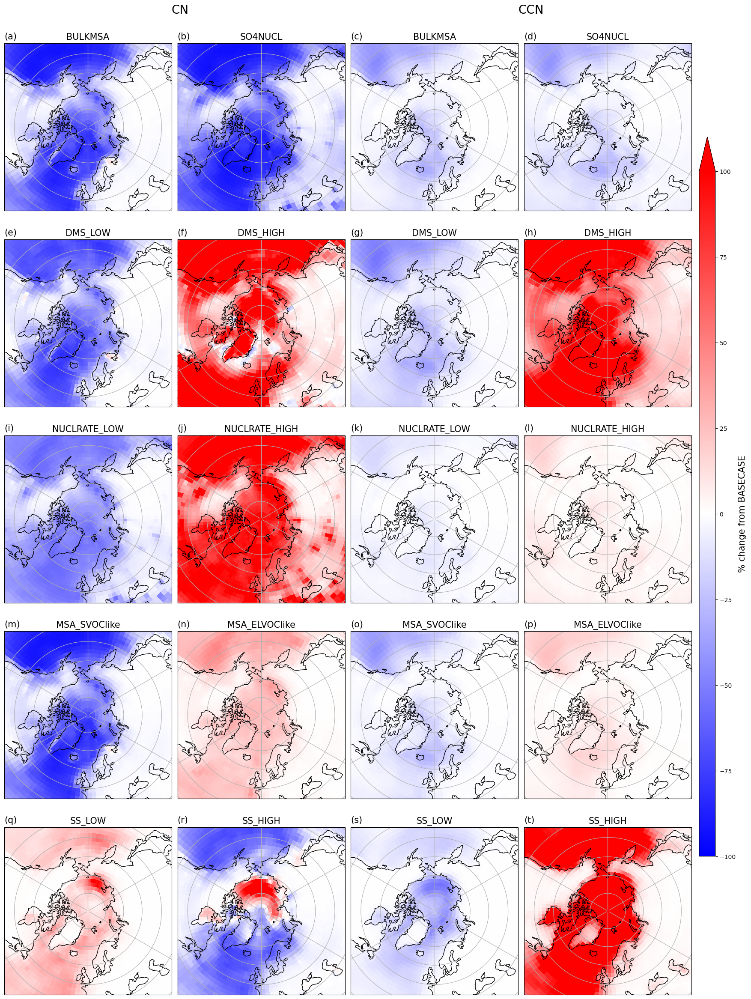

In [68]:
import cartopy.crs as ccrs
fig, axis = plt.subplots(5, 4, figsize = (18,24),subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
plot = basecaseso4nuc_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[0,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[0,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[1,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot1 = dmslow_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[1,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[2,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[2,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[3,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[3,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[4,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff.pdiffconccn[0,0,:,:].plot(ax=axis[4,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = basecaseso4nuc_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[0,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[0,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[1,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmslow_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[1,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[2,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[2,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[3,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[3,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[4,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff['pdiffCCN0.20'][0,0,:,:].plot(ax=axis[4,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)

exps = ['BULKMSA','SO4NUCL','DMS_LOW','DMS_HIGH','NUCLRATE_LOW','NUCLRATE_HIGH','MSA_SVOClike','MSA_ELVOClike','SS_LOW','SS_HIGH',]
indices = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)']
for i in range(5):
    for j in range(4):
        axis[i,j].coastlines()
        axis[i,j].set_extent([-180,180,90,45],ccrs.PlateCarree())
        axis[i,j].set_title(exps[j%2+(2*i)],size = 15)
        axis[i,j].gridlines()
        #axis[i,j].add_geometries(full_geom_feb.geoms,crs=ccrs.PlateCarree(),facecolor = 'none',edgecolor='green',linewidth=2)
        axis[i,j].text(0, 1.025,indices[j+(4*i)],transform=axis[i,j].transAxes,size = 15)
plt.tight_layout()
plt.figtext(0.225,0.97,'CN',fontsize = 20)
plt.figtext(0.675,0.97,'CCN',fontsize = 20)
fig.subplots_adjust(top=0.95)
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.91, 0.15, 0.021, 0.7])
fig.colorbar(plot1, cax=cbar_ax,extend='max').set_label(label= '% change from BASECASE',size = 15)

plt.savefig('../figures/202008-pdfifffull.png',dpi = 300)

# make colorbar common
# mark lat and lon on the plot

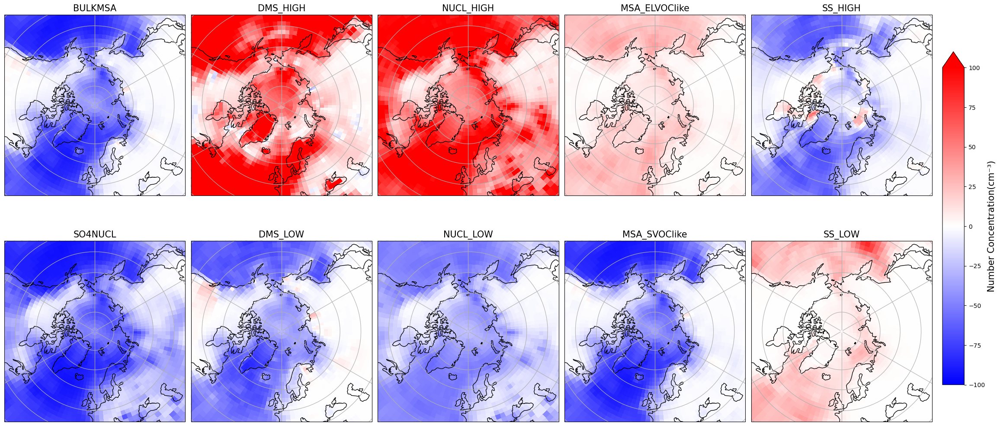

In [96]:
import cartopy.crs as ccrs
fig, axis = plt.subplots(2, 5, figsize = (24,11),subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
plot = basecaseso4nuc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot1 = dmslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,2],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,3],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,4],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,4],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
exps = exps = ['BULKMSA','SO4NUCL','DMS_HIGH','DMS_LOW','NUCL_HIGH','NUCL_LOW','MSA_ELVOClike','MSA_SVOClike','SS_HIGH','SS_LOW']
indices = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)']
for i in range(2):
    for j in range(5):
        axis[i,j].coastlines()
        axis[i,j].set_extent([-180,180,90,45],ccrs.PlateCarree())
        axis[i,j].set_title(exps[i+(2*j)],size = 15)
        axis[i,j].gridlines()
        #axis[i,j].add_geometries(full_geom_feb.geoms,crs=ccrs.PlateCarree(),facecolor = 'none',edgecolor='green',linewidth=2)
        #axis[i,j].text(0, 1.025,indices[j+(2*i)],transform=axis[i,j].transAxes,size = 15)
plt.tight_layout()
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.91, 0.15, 0.021, 0.7])
fig.colorbar(plot1, cax=cbar_ax,extend='max').set_label(label  = '% change from BASECASE',fontsize = 15)

# make colorbar common
# mark lat and lon on the plot

#plt.tight_layout()
plt.savefig('../figures/202008-percentdiff-conccn-transverse.png',dpi = 300)

# make colorbar common
# mark lat and lon on the plot

In [105]:
basecase = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-basecase/globvals/mosaic-basecase-202008-monmean.nc')
bulkmsa = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-bulkmsa/mosaic-bulkmsa-monmean08.nc')
basecase_so4nuc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-basecase-nonucl/mosaic-basecase-nonucl-monmean08.nc')
dmshigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-dmshigh/globvals/mosaic-dmshigh-202008-monmean.nc')
dmslow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-dmslow/globvals/mosaic-dmslow-202008-monmean.nc')
nuclhigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-nuclhigh/globvals/mosaic-nuclhigh-202008-monmean.nc')
nucllow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-nucllow/mosaic-nucllow-monmean08.nc')
msaelvoc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-msaelvoc/globvals/mosaic-msaelvoc-202008-monmean.nc')
msasvoc = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-msasvoc/globvals/mosaic-msasvoc-202008-monmean.nc')
sshigh = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-sshigh/globvals/mosaic-sshigh-202008-monmean.nc')
sslow = xr.open_dataset('/home/chandras/mosaic-paper/sensitivityanalysis/mosaic-sslow/mosaic-sslow-monmean08.nc')

In [106]:
basecase_conccn = conccn(basecase)
bulkmsa_conccn = conccn(bulkmsa)
basecaseso4nuc_conccn = conccn(basecase_so4nuc)
dmshigh_conccn = conccn(dmshigh)
dmslow_conccn = conccn(dmslow)
nuclhigh_conccn = conccn(nuclhigh)
nucllow_conccn = conccn(nucllow)
msaelvoc_conccn = conccn(msaelvoc)
msasvoc_conccn = conccn(msasvoc)
sshigh_conccn = conccn(sshigh)
sslow_conccn = conccn(sslow)

In [107]:
vars = ['conccn']
bulkmsa_percentdiff = percent_diff(bulkmsa_conccn,basecase_conccn,vars)
basecaseso4nuc_percentdiff =  percent_diff(basecaseso4nuc_conccn,basecase_conccn,vars)
dmshigh_percentdiff = percent_diff(dmshigh_conccn,basecase_conccn,vars)
dmslow_percentdiff = percent_diff(dmslow_conccn,basecase_conccn,vars)
nuclhigh_percentdiff = percent_diff(nuclhigh_conccn,basecase_conccn,vars)
nucllow_percentdiff = percent_diff(nucllow_conccn,basecase_conccn,vars)
msaelvoc_percentdiff = percent_diff(msaelvoc_conccn,basecase_conccn,vars)
msasvoc_percentdiff = percent_diff(msasvoc_conccn,basecase_conccn,vars)
sshigh_percentdiff = percent_diff(sshigh_conccn,basecase_conccn,vars)
sslow_percentdiff = percent_diff(sslow_conccn,basecase_conccn,vars)

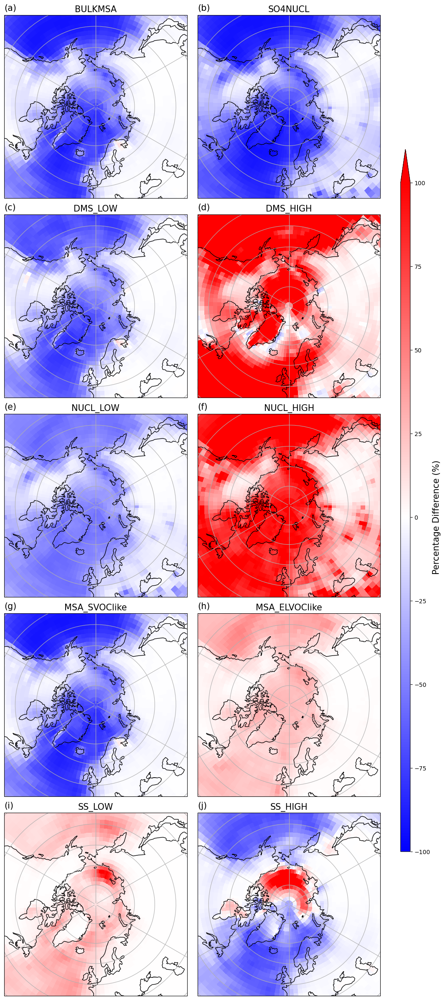

In [108]:
import cartopy.crs as ccrs
fig, axis = plt.subplots(5, 2, figsize = (8,20),subplot_kw=dict(projection=ccrs.NorthPolarStereo()))
plot = basecaseso4nuc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = bulkmsa_percentdiff.pdiff[0,0,:,:].plot(ax=axis[0,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = dmshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot1 = dmslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[1,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nuclhigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[2,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = nucllow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[2,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msaelvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[3,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = msasvoc_percentdiff.pdiff[0,0,:,:].plot(ax=axis[3,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sshigh_percentdiff.pdiff[0,0,:,:].plot(ax=axis[4,1],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
plot = sslow_percentdiff.pdiff[0,0,:,:].plot(ax=axis[4,0],transform=ccrs.PlateCarree(),vmax = 100, vmin = -100,cmap = 'bwr',add_colorbar = False)
exps = ['BULKMSA','SO4NUCL','DMS_LOW','DMS_HIGH','NUCL_LOW','NUCL_HIGH','MSA_SVOClike','MSA_ELVOClike','SS_LOW','SS_HIGH',]
indices = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)']
for i in range(5):
    for j in range(2):
        axis[i,j].coastlines()
        axis[i,j].set_extent([-180,180,90,45],ccrs.PlateCarree())
        axis[i,j].set_title(exps[j+(2*i)],size = 20)
        axis[i,j].gridlines()
        #axis[i,j].add_geometries(full_geom_feb.geoms,crs=ccrs.PlateCarree(),facecolor = 'none',edgecolor='green',linewidth=2)
        axis[i,j].text(0, 1.025,indices[j+(2*i)],transform=axis[i,j].transAxes,size = 15)
plt.tight_layout()
fig.subplots_adjust(right=0.90)
cbar_ax = fig.add_axes([0.91, 0.15, 0.021, 0.7])
fig.colorbar(plot1, cax=cbar_ax,extend='max').set_label(label= 'Percentage Change (%)',size = 20)

plt.savefig('../figures/202008-conccnpdiff.png',dpi = 300)
plt.show()
# make colorbar common
# mark lat and lon on the plot